# Set up workspace

In [1]:
import xarray as xr
import matplotlib.pyplot as plt
import numpy as np
import cartopy
from cartopy.util import add_cyclic_point
import cartopy.crs as ccrs

In [3]:
import sys
sys.path.append('/glade/u/home/czarakas/coupled_PPE/code/utils')

In [4]:
from load_ensembles import *
import quick_map

In [5]:
from load_gridcell_areas import *
from plotting_settings import *

In [6]:
path_in='/glade/work/czarakas/coupled_PPE/data/data_for_figures/'

# Load data

### Figure S1

In [7]:
ds_Ts = xr.open_dataset(path_in+'annual_means/delta_TSKIN_Annual_mean_coupled.nc')['TSKIN']
pvals_Ts=xr.open_dataset(path_in+'annual_means/pval_TSKIN_Annual_mean_coupled.nc')['pval']

ds_ref=xr.open_dataset(path_in+'annual_means/ref_TSKIN_Annual_mean_coupled.nc')['TSKIN']

### Figure S2

In [18]:
ds_Ts = xr.open_dataset(path_in+'annual_means/delta_TS_Annual_mean_coupled.nc')['TS']
pvals_Ts=xr.open_dataset(path_in+'annual_means/pval_TS_Annual_mean_coupled.nc')['pval']

ds_ref=xr.open_dataset(path_in+'annual_means/ref_TS_Annual_mean_coupled.nc')['TS']

### Figure S8

In [24]:
ds_P = xr.open_dataset(path_in+'annual_means/delta_calculated_PREC_FROM_ATM_Annual_mean_coupled.nc')['calculated_PREC_FROM_ATM']
pvals_P=xr.open_dataset(path_in+'annual_means/pval_calculated_PREC_FROM_ATM_Annual_mean_coupled.nc')['pval']

ds_ref=xr.open_dataset(path_in+'annual_means/ref_calculated_PREC_FROM_ATM_Annual_mean_coupled.nc')['calculated_PREC_FROM_ATM']

### Figure S9

In [34]:
ds_P = xr.open_dataset(path_in+'annual_means/delta_calculated_PRECT_Annual_mean_coupled.nc')['calculated_PRECT']
pvals_P=xr.open_dataset(path_in+'annual_means/pval_calculated_PRECT_Annual_mean_coupled.nc')['pval']

ds_ref=xr.open_dataset(path_in+'annual_means/ref_calculated_PRECT_Annual_mean_coupled.nc')['calculated_PRECT']

### Reindex weights as needed

In [35]:
landweights2=landweights2.reindex_like(ds_ref, method='nearest',tolerance=0.05)
weight_factor_atm=weight_factor_atm.reindex_like(ds_ref, method='nearest',tolerance=0.05)

# Make figure with subplots (S1, S3, S7)

### Define functions and information to use in all plots

In [27]:
def plot_subplot(mapdata, sigmask=None, colorbar=None, title=None,
                 nrow=6, ncol=6,ind=1,
                vmin=-2, vmax=2, cmap=plt.cm.get_cmap("bwr",11),
                orientation='horizontal'):
    ax = plt.subplot(nrow, ncol, ind, projection=ccrs.Robinson())
    ax.coastlines(resolution='110m') #learn how to add resolution here??
    ax.set_global()

    cyclic_data, cyclic_lons = add_cyclic_point(mapdata, coord=mapdata.lon)
    plt.pcolormesh(cyclic_lons, mapdata.lat, #contourf
                   cyclic_data, 
                   cmap=cmap, vmin=vmin, vmax=vmax,#levels=np.arange(-100,100),
                   transform=ccrs.PlateCarree())
    if colorbar is not None: plt.colorbar(extend='both', orientation=orientation)
    if sigmask is not None:
        cyclic_data_mask, cyclic_lons_mask = add_cyclic_point(sigmask, coord=sigmask.lon)
        ax.contourf(
            cyclic_lons_mask, sigmask.lat, cyclic_data_mask,
            transform=ccrs.PlateCarree(),
            colors='none',
            levels=[0.5, 1.5],
            hatches=['xxxx'])
    if title is not None: plt.title(title)

    ax.add_feature(cartopy.feature.OCEAN, facecolor='white', zorder=1)
    ax.coastlines()

In [28]:
def plot_subplot_withocean(mapdata, sigmask=None, colorbar=None, title=None,
                 nrow=6, ncol=6,ind=1,
                vmin=-2, vmax=2, cmap=plt.cm.get_cmap("bwr",11),
                orientation='horizontal'):
    ax = plt.subplot(nrow, ncol, ind, projection=ccrs.Robinson())
    ax.coastlines(resolution='110m') #learn how to add resolution here??
    ax.set_global()

    cyclic_data, cyclic_lons = add_cyclic_point(mapdata, coord=mapdata.lon)
    plt.pcolormesh(cyclic_lons, mapdata.lat, #contourf
                   cyclic_data, 
                   cmap=cmap, vmin=vmin, vmax=vmax,#levels=np.arange(-100,100),
                   transform=ccrs.PlateCarree())
    if colorbar is not None: plt.colorbar(extend='both', orientation=orientation)
    if sigmask is not None:
        cyclic_data_mask, cyclic_lons_mask = add_cyclic_point(sigmask, coord=sigmask.lon)
        ax.contourf(
            cyclic_lons_mask, sigmask.lat, cyclic_data_mask,
            transform=ccrs.PlateCarree(),
            colors='none',
            levels=[0.5, 1.5],
            hatches=['xxxx'])
    if title is not None: plt.title(title)

    ax.coastlines()

### Figure S1

In [12]:
# FOR S1
pvals=pvals_Ts
ds=ds_Ts
var='Temperature'
cmap=plt.cm.get_cmap("bwr",11)
vmin=-2
vmax=2

In [13]:
# method 1: no FDR analysis
sigmask=(pvals>0.05)
fracs_changed_land=(((pvals<=0.05)*landweights2).sum(dim=['lat','lon'])).values

In [14]:
# method 2: FDR analysis
from FDR_analysis import *

K=(landweights2.values.flatten()>0).sum()
sig_change=calculate_sig_changes_FDR(pvals, 
                              K=K,
                              alpha_global=0.05)

#pct_change_Ts=((sig_change_Ts)*landweights2).sum(dim=['lat','lon'])*100
sigmask=(sig_change<1)
fracs_changed_land=(((sig_change)*landweights2).sum(dim=['lat','lon'])).values
#fracs_changed_land

/glade/u/ssg/ch/usr/jupyterhub/envs/pangeo-2019.09.12/lib/python3.7/site-packages/ipykernel_launcher.py:4: RuntimeWarning: invalid value encountered in greater
  after removing the cwd from sys.path.


In [15]:
pval=pvals[:,:,0]
K = np.sum(~np.isnan(pval).values)
alpha_global=0.05
p_Walker=1-np.power((1-alpha_global),(1/K))

Walker_tests=[]
# Do Walker's test
for i, key in enumerate(ds.ensemble_key):
    #print(crosswalk.description.values[(crosswalk.key_landonlyPPE==ds.case_id[0:8]).values][0])
    pval=pvals[:,:,i]
    Walker_test=(np.nanmin(pval)<=p_Walker)
    #print(np.nanmin(pval))
    if Walker_test:
        Walker_tests.append('*')
    else:
        Walker_tests.append('')

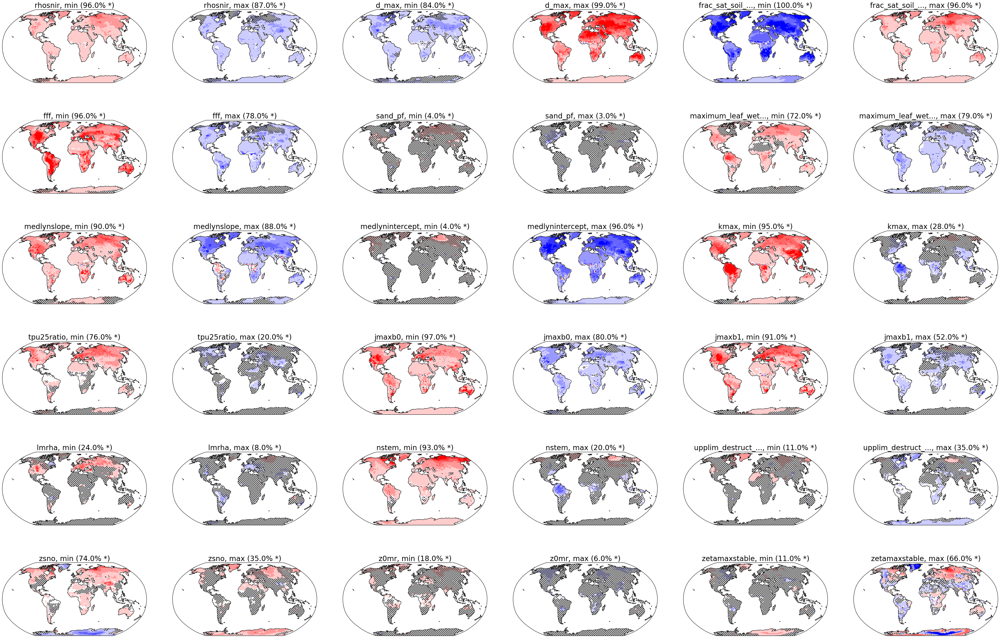

In [16]:
plt.rcParams.update({'font.size': 19})
fig = plt.figure(figsize=(45,30))
for j,i in enumerate(int_list):
    title=(crosswalk_descriptions_short[i]+' ('+
           str(np.round(fracs_changed_land[i]*100))+'% '+
           Walker_tests[i]+')'
          )

    plot_subplot(ds[:,:,i],ind=j+1, sigmask=sigmask[:,:,i],
                title=title,
                vmin=vmin, vmax=vmax, cmap=cmap)

plt.tight_layout()
plt.savefig('../Figures/'+var+'_landOnly_'+'subplots_FDR.pdf')

### Figure S2

In [19]:
# FOR S1
pvals=pvals_Ts
ds=ds_Ts
var='Temperature'
cmap=plt.cm.get_cmap("bwr",11)
vmin=-2
vmax=2

In [20]:
# method 1: no FDR analysis
fracs_changed_ocean=(((pvals<=0.05)*weight_factor_atm).mean(dim=['lat','lon'])).values
sigmask=(pvals>0.05)

In [21]:
# method 2: FDR analysis
from FDR_analysis import *

K=(~np.isnan(pvals[:,:,0]).values.flatten()>0).sum()
print(K)
sig_change=calculate_sig_changes_FDR(pvals, 
                              K=K,
                              alpha_global=0.05)

#pct_change_Ts=((sig_change_Ts)*landweights2).sum(dim=['lat','lon'])*100
sigmask=(sig_change<1)
fracs_changed_ocean=(((sig_change)*weight_factor_atm).mean(dim=['lat','lon'])).values
#fracs_changed_land

13824


In [22]:
pval=pvals[:,:,0]
K = np.sum(~np.isnan(pval).values)
alpha_global=0.05
p_Walker=1-np.power((1-alpha_global),(1/K))

Walker_tests=[]
# Do Walker's test
for i, key in enumerate(ds.ensemble_key):
    #print(crosswalk.description.values[(crosswalk.key_landonlyPPE==ds.case_id[0:8]).values][0])
    pval=pvals[:,:,i]
    Walker_test=(np.nanmin(pval)<=p_Walker)
    #print(np.nanmin(pval))
    if Walker_test:
        Walker_tests.append('*')
    else:
        Walker_tests.append('')

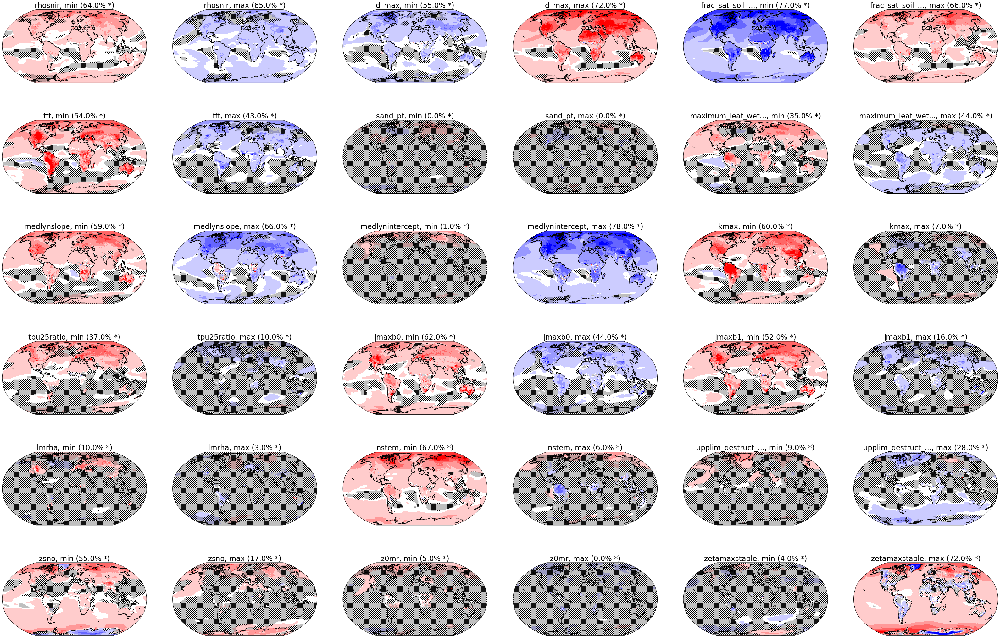

In [23]:
plt.rcParams.update({'font.size': 19})
fig = plt.figure(figsize=(45,30))
for j,i in enumerate(int_list):
    title=(crosswalk_descriptions_short[i]+' ('+
           str(np.round(fracs_changed_ocean[i]*100))+'% '+
           Walker_tests[i]+')'
          )

    plot_subplot_withocean(ds[:,:,i],ind=j+1, sigmask=sigmask[:,:,i],
                title=title,
                vmin=vmin, vmax=vmax, cmap=cmap)

plt.tight_layout()
plt.savefig('../Figures/'+var+'_landAndOcean_'+'subplots_FDR.pdf')

### Figure S8

In [29]:
pvals=pvals_P
ds=ds_P*365*86400
var='Precipitation'
cmap=plt.cm.get_cmap("BrBG",11)
vmin=-150
vmax=150

In [30]:
# method 1: no FDR analysis
fracs_changed_land=(((pvals<=0.05)*landweights2).sum(dim=['lat','lon'])).values
sigmask=(pvals>0.05)

In [31]:
# method 2: FDR analysis
from FDR_analysis import *

K=(landweights2.values.flatten()>0).sum()
print(K)
sig_change=calculate_sig_changes_FDR(pvals, 
                              K=K,
                              alpha_global=0.05)
sig_change=sig_change.where(landweights2>0)
#pct_change_Ts=((sig_change_Ts)*landweights2).sum(dim=['lat','lon'])*100
sigmask=(sig_change<1)
fracs_changed_land=(((sig_change)*landweights2).sum(dim=['lat','lon'])).values
#fracs_changed_land

5666


/glade/u/ssg/ch/usr/jupyterhub/envs/pangeo-2019.09.12/lib/python3.7/site-packages/ipykernel_launcher.py:4: RuntimeWarning: invalid value encountered in greater
  after removing the cwd from sys.path.


In [32]:
pval=pvals[:,:,0]
K = np.sum(~np.isnan(pval).values)
alpha_global=0.05
p_Walker=1-np.power((1-alpha_global),(1/K))

Walker_tests=[]
# Do Walker's test
for i, key in enumerate(ds.ensemble_key):
    #print(crosswalk.description.values[(crosswalk.key_landonlyPPE==ds.case_id[0:8]).values][0])
    pval=pvals[:,:,i]
    Walker_test=(np.nanmin(pval)<=p_Walker)
    #print(np.nanmin(pval))
    if Walker_test:
        Walker_tests.append('*')
    else:
        Walker_tests.append('')

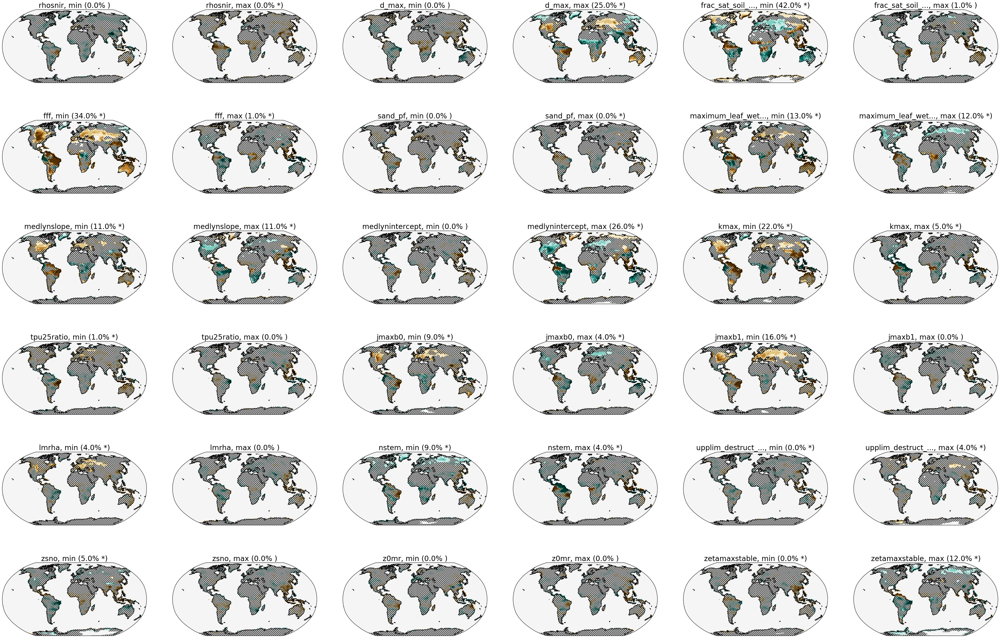

In [33]:
plt.rcParams.update({'font.size': 19})
fig = plt.figure(figsize=(45,30))
for j,i in enumerate(int_list):
    title=(crosswalk_descriptions_short[i]+' ('+
           str(np.round(fracs_changed_land[i]*100))+'% '+
           Walker_tests[i]+')'
          )

    plot_subplot_withocean(ds[:,:,i],ind=j+1, sigmask=sigmask[:,:,i],
                title=title,
                vmin=vmin, vmax=vmax, cmap=cmap)

plt.tight_layout()
plt.savefig('../Figures/'+var+'_landOnly_subplots_FDR.pdf')

### Figure S9

In [36]:
pvals=pvals_P
ds=ds_P*365*86400*1000
var='Precipitation'
cmap=plt.cm.get_cmap("BrBG",11)
vmin=-150
vmax=150

In [37]:
# method 1: no FDR analysis
fracs_changed_ocean=(((pvals<=0.05)*weight_factor_atm).mean(dim=['lat','lon'])).values
sigmask=(pvals>0.05)

In [38]:
# method 2: FDR analysis
from FDR_analysis import *

K=(~np.isnan(pvals[:,:,0]).values.flatten()>0).sum()
print(K)
sig_change=calculate_sig_changes_FDR(pvals, 
                              K=K,
                              alpha_global=0.05)

#pct_change_Ts=((sig_change_Ts)*landweights2).sum(dim=['lat','lon'])*100
sigmask=(sig_change<1)
fracs_changed_ocean=(((sig_change)*weight_factor_atm).mean(dim=['lat','lon'])).values
#fracs_changed_land

13824


In [39]:
pval=pvals[:,:,0]
K = np.sum(~np.isnan(pval).values)
alpha_global=0.05
p_Walker=1-np.power((1-alpha_global),(1/K))

Walker_tests=[]
# Do Walker's test
for i, key in enumerate(ds.ensemble_key):
    #print(crosswalk.description.values[(crosswalk.key_landonlyPPE==ds.case_id[0:8]).values][0])
    pval=pvals[:,:,i]
    Walker_test=(np.nanmin(pval)<=p_Walker)
    #print(np.nanmin(pval))
    if Walker_test:
        Walker_tests.append('*')
    else:
        Walker_tests.append('')

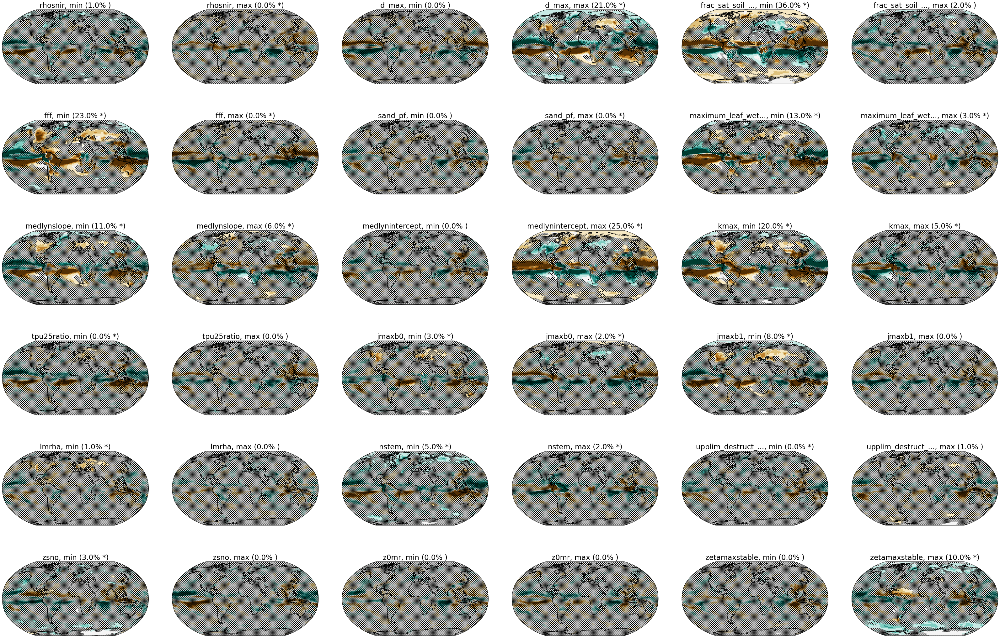

In [40]:
plt.rcParams.update({'font.size': 19})
fig = plt.figure(figsize=(45,30))
for j,i in enumerate(int_list):
    title=(crosswalk_descriptions_short[i]+' ('+
           str(np.round(fracs_changed_ocean[i]*100))+'% '+
           Walker_tests[i]+')'
          )

    plot_subplot_withocean(ds[:,:,i],ind=j+1, sigmask=sigmask[:,:,i],
                title=title,
                vmin=vmin, vmax=vmax, cmap=cmap)

plt.tight_layout()
plt.savefig('../Figures/'+var+'_landAndOcean_subplots_FDR.pdf')

### Get the colorbar

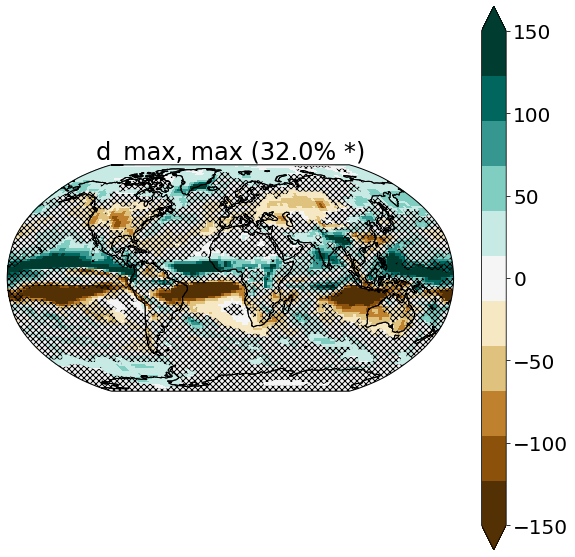

In [38]:
# Do this to get the colorbar

plt.rcParams.update({'font.size': 20})
fig = plt.figure(figsize=(10,10))
i=3
title=(crosswalk_descriptions_short[i]+' ('+
           str(np.round(fracs_changed_ocean[i]*100))+'% '+
           Walker_tests[i]+')'
          )
plot_subplot_withocean(ds[:,:,i],nrow=1, ncol=1,sigmask=sigmask[:,:,i], 
             colorbar=True, orientation='vertical', title=title,
            vmin=vmin, vmax=vmax, cmap=cmap)
plt.savefig('Figures/'+var+'_'+'subplots_colorbar.pdf')